In [ ]:
import os
import sys
sys.path.append("../")

import numpy as np
from pandas import Series, DataFrame as df, read_csv, concat
from imageio import (imread, imwrite)

# import matplotlib
# matplotlib.use('agg')
import matplotlib.pylab as plt
import matplotlib.patches as patches

from skimage.measure import regionprops

from Random_utils import (
        reverse_dict, onehottify)
from data_management import (
    get_fov_bounds, get_imindices_str)
from matplotlib.colors import ListedColormap
import hickle as hkl

from bootstrapping_utils import (
    FC_CRF, occupy_full_GT_range, create_dir, 
    get_shuffled_cmap, visualize_nuclei, 
)

from maskrcnn_region_integration_utils import (
    preprocess_mrcnn_output_tile, reconcile_mrcnn_with_regions, 
    get_nuclei_props_and_outliers, get_discordant_nuclei, 
    get_fov_stats, choose_fovs_for_review, 
    choose_fovs_for_review_stratified, 
    add_annots_and_fovs_to_db,
)

import random
import string

In [2]:
#%%=======================================================================
# Methods
#=======================================================================



In [2]:
#%%=======================================================================
# Paths and params
#=======================================================================

base_data_path = "/mnt/Tardis/MohamedTageldin/TCGA_dataset/"
#base_data_path = "C:/Users/tageldim/Desktop/WSI_Segmentation/Data/TCGAdataset/"

base_save_path = "/home/mohamedt/Desktop/WSI_Segmentation/Results/TCGA_maskrcnn/19July2018/nucleus20180720T1413_0030/"

imagepath = base_data_path + "TCGA_TNBC_rgbImages/ductal_normalized/"
region_mask_path = base_data_path + "TCGA_TNBC_2018-02-26/masks/core_set_151_slides/"
mrcnn_mask_path = base_save_path + "mrcnn_preds/"

mask_save_path = base_save_path + "mrcnn_regions_incorp/"
mask_vis_save_path = base_save_path + "mrcnn_regions_incorp_visualization/"
sqlite_save_path_base = base_save_path.replace('Results', 'Results_local') + "mrcnn_regions_incorp_sqlite/"
sqlite_save_path = sqlite_save_path_base + "nucleus20180720T1413_0030_regions_incorp.db"

codes_regions_path = base_data_path + "TCGA_TNBC_2018-02-26/BRCA_class_labels.tsv"

ext_imgs= ".png"

In [3]:
# %%===========================================================================
# constants
# =============================================================================

# read region codes
# This is the meaning of pixel labels in region-level output
# these codes were obtained from the "BRCA_class_labels.tsv"
# file associated with the TCGA crowdsourcing dataset
codes_region = read_csv(codes_regions_path, sep='\t', index_col= 0)

# params for getting low confidence nuclei for FOV proposal
confidence_thresh = 0.4
props_fraction = 0.05

# params for getting review fov's
fov_dims = (256,256)
shift_step = 0 
fovs_per_prop_review = 10
exclude_edge= 128
min_nuclei_per_fov = 10

In [4]:
# %%===========================================================================
# JUPYTER NOTEBOOK 
# =============================================================================
codes_region

,label_priority,color,substrings,substring_level,GT_code
label,,,,,
roi,primary,"rgb(255,0,0)","roi,region,",second,99
evaluation_roi,secondary,"rgb(255,0,0)","evaluation,",second,99
mostly_tumor,primary,"rgb(255,0,0)","tumo,tumu,tumer,",second,1
mostly_stroma,primary,"rgb(255,125,0)","strom,",second,2
mostly_lymphocytic_infiltrate,primary,"rgb(0,0,255)","lymphocyt,",second,3
necrosis_or_debris,primary,"rgb(255,255,0)","necr,debr,",second,4
glandular_secretions,primary,"rgb(0,255,0)","secre,",second,5
mostly_blood,primary,"rgb(128,0,128)","blood,",first,6
exclude,primary,"rgb(0,0,0)","exclud,",second,7


In [5]:
# %%===========================================================================
# further ground work
# =============================================================================

# convert to dict and remove prepended "mostly_"
codes_region = dict(codes_region["GT_code"])
for k in codes_region.keys():
    if 'mostly_' in k:
        codes_region[k.replace('mostly_','')] = codes_region.pop(k)

# some processing of region code keys to reflect nucleus naming
del codes_region['roi']
del codes_region['evaluation_roi']
codes_region['background'] = 0
codes_region['fibroblast'] = codes_region.pop("stroma")
codes_region['lymphocyte'] = codes_region.pop("lymphocytic_infiltrate")
codes_region['plasma_cell'] = codes_region.pop("plasma_cells")
codes_region['other_inflammatory'] = codes_region.pop("other_immune_infiltrate")
codes_region['vascular_endothelium'] = codes_region.pop("blood_vessel")
codes_region['adipocyte'] = codes_region.pop("fat")
codes_region['skin_adnexa'] = codes_region.pop("skin_adnexia")

# label mapping -- relative to original codes
lbl_mapping = [(codes_region["angioinvasion"], codes_region["tumor"]), 
               (codes_region["dcis"], codes_region["tumor"])]

# This is the meaning of pixel labels in mrcnn output (and in bootstrap)
codes_mrcnn = {
    "background":  0, 
    "tumor": 1, 
    "fibroblast": 2, 
    "lymphocyte": 3,
    "plasma_cell": 4,
    "other_inflammatory": 5,
    "other": 6,
}

# reverse mappings
codes_region_reverse = reverse_dict(codes_region)
codes_mrcnn_reverse = reverse_dict(codes_mrcnn)

# This dict maps mrcnn nucleus codes to region codes
code_rmap_dict = dict()
for k in codes_mrcnn.keys():
    code_rmap_dict[codes_mrcnn[k]] = codes_region[k]
    
# Any class not on this list will receive its label based on
# the region in which the cell resides -- NOTE: Our reference
# here is the region map NOT the mrcnn output. This important
# because "background" in region map means it is outside ROI 
# boundary and should be removed from mrcnn prediction, whereas
# "background" in mrcnn just means mrcnn did nto predict a nucleus 
# at that location
KEEP_CLASSES = ["tumor", "fibroblast", "lymphocyte", 
                "plasma_cell", "other_inflammatory", "exclude"]
KEEP_CLASSES_CODES = [codes_region[k] for k in KEEP_CLASSES]

# relevant labels to keep in mind
# when choosing FOVs later
relevant_labels_for_fov_choice = [
    codes_region["tumor"],
    codes_region["fibroblast"],
    codes_region["lymphocyte"],
    codes_region["plasma_cell"],
    codes_region["other_inflammatory"],
]

# codes to ignore when getting nuclei for review
ignore_codes = [0, codes_region["necrosis_or_debris"]]

In [6]:
# %%===========================================================================
# JUPYTER NOTEBOOK 
# =============================================================================

print("codes_region:\n", codes_region, "\n")
print("code_rmap_dict:\n", code_rmap_dict)

codes_region:
 {'angioinvasion': 19, 'background': 0, 'nerve': 16, 'glandular_secretions': 5, 'skin_adnexa': 17, 'adipocyte': 9, 'normal_acinus_or_duct': 13, 'lymphocyte': 3, 'other_inflammatory': 11, 'other': 21, 'tumor': 1, 'dcis': 20, 'exclude': 7, 'metaplasia_NOS': 8, 'vascular_endothelium': 18, 'blood': 6, 'plasma_cell': 10, 'mucoid_material': 12, 'fibroblast': 2, 'lymphatics': 14, 'necrosis_or_debris': 4, 'undetermined': 15} 

code_rmap_dict:
 {0: 0, 1: 1, 2: 2, 3: 3, 4: 10, 5: 11, 6: 21}


In [8]:
#%%=======================================================================
# Ground work
#=======================================================================

print("Getting list of images and some ground work ...")

# Get list of images and labels
im_list = [j.split(ext_imgs)[0] for j in os.listdir(imagepath) if ext_imgs in j]
region_prefix = "crowdsource_revision0_"
region_list = [j.split(region_prefix)[1].split(".png")[0] 
               for j in os.listdir(region_mask_path) if ".png" in j]

mrcnn_list_tiles = [j.split(".hkl")[0] for j in os.listdir(mrcnn_mask_path) if ".hkl" in j]
mrcnn_list = [str(j) for j in list(np.unique([j.split('_rowmin')[0] for j in mrcnn_list_tiles]))]

# create save path if nonexistent
create_dir(mask_save_path)
create_dir(mask_vis_save_path)
create_dir(sqlite_save_path_base)

# don't redo work
#already_done = [j.split(".hkl")[0] for j in os.listdir(mask_save_path) if ".hkl" in j]
#im_list = [j for j in im_list if j not in already_done]

# first we save a dataframe of what the ground truth codes mean
codes_region_df = Series(codes_region)
codes_region_df.to_csv(base_save_path + "gtruth_codes.csv")

Getting list of images and some ground work ...
folder /home/mohamedt/Desktop/WSI_Segmentation/Results/TCGA_maskrcnn/19July2018/nucleus20180720T1413_0030/mrcnn_regions_incorp/ already exists! moving on.
folder /home/mohamedt/Desktop/WSI_Segmentation/Results/TCGA_maskrcnn/19July2018/nucleus20180720T1413_0030/mrcnn_regions_incorp_visualization/ already exists! moving on.
folder /home/mohamedt/Desktop/WSI_Segmentation/Results_local/TCGA_maskrcnn/19July2018/nucleus20180720T1413_0030/mrcnn_regions_incorp_sqlite/ already exists! moving on.


In [9]:
# %%===========================================================================
# JUPYTER NOTEBOOK 
# =============================================================================

# for the purposes of this notebook, let's also
# read boostrapped nuclei to visualize differences from mrcnn
bootstrap_mask_path = base_data_path + "nucleus_segmentation_from_region_priors/"
bootstrap_list = [j.split(".hkl")[0] for j in os.listdir(bootstrap_mask_path) if ".hkl" in j]

In [76]:
# %%===========================================================================
# JUPYTER NOTEBOOK 
# =============================================================================

print("len(im_list) =", len(im_list))
print("len(region_list) =", len(region_list))
print("len(bootstrap_list) =", len(bootstrap_list))
print("len(mrcnn_list) =", len(mrcnn_list))
print("len(mrcnn_list_tiles) =", len(mrcnn_list_tiles))
print("")
print("im_list[0] =", im_list[0])
print("region_list[0] =", region_list[0])
print("bootstrap_list[0] =", bootstrap_list[0])
print("mrcnn_list[0] =", mrcnn_list[0])
print("mrcnn_list_tiles[0] =", mrcnn_list_tiles[0])

len(im_list) = 124
len(region_list) = 151
len(bootstrap_list) = 106
len(mrcnn_list) = 125
len(mrcnn_list_tiles) = 184616

im_list[0] = TCGA-A1-A0SP-DX1_xmin6798_ymin53719_
region_list[0] = TCGA-A1-A0SK-DX1_xmin45749_ymin25055_
bootstrap_list[0] = TCGA-A1-A0SP-DX1_xmin6798_ymin53719_
mrcnn_list[0] = TCGA-A1-A0SP-DX1_xmin6798_ymin53719_
mrcnn_list_tiles[0] = TCGA-A1-A0SP-DX1_xmin6798_ymin53719__rowmin0_rowmax256_colmin1024_colmax1280


In [10]:
#%%=======================================================================
# Define color maps
#=======================================================================

# A random colormap (for anything)
cmap = get_shuffled_cmap(plt.cm.tab20)

# random colormaps whose colors also encode labels
# We'll be using the "fixed" region codes for consistency
cmaps = {codes_region["tumor"]: get_shuffled_cmap(plt.cm.Reds),
         codes_region["fibroblast"]: get_shuffled_cmap(plt.cm.Greens),
         codes_region["lymphocyte"]: get_shuffled_cmap(plt.cm.Blues),
         codes_region["plasma_cell"]: get_shuffled_cmap(plt.cm.cool),
         codes_region["other_inflammatory"]: get_shuffled_cmap(plt.cm.autumn),
         codes_region["other"]: get_shuffled_cmap(plt.cm.Greys),
        }

# single color map to visualize single instance overlays
cmap_single = ListedColormap(["red"])

# A named color map encoding class
clist =  ['grey' for j in range(len(codes_region.keys()))]
clist[codes_region['background']] = 'black'
clist[codes_region['tumor']] = 'red'
clist[codes_region['fibroblast']] = 'green'
clist[codes_region['lymphocyte']] = 'blue'
clist[codes_region['plasma_cell']] = 'cyan'
clist[codes_region['other_inflammatory']] = 'slateblue'
clist[codes_region['necrosis_or_debris']] = 'yellow'
cmap_classlabels = ListedColormap(clist)
n_classes = len(clist)

In [11]:
# %%===========================================================================
# Iterate through unique slides
# =============================================================================

imidx = 0; imname = im_list[imidx] # 11 is rotated ROI
# for imidx, imname in enumerate(im_list):

print("\nslide %d of %d: %s" % (imidx, len(im_list), imname))


slide 0 of 125: TCGA-A1-A0SP-DX1_xmin6798_ymin53719_


In [12]:
# %%===========================================================================
# Read ROI
# =============================================================================

print("\tReading RGB and region mask images ...")

im = imread(imagepath + imname + ext_imgs, pilmode= "RGB")
regions = imread(region_mask_path + region_prefix + imname + ".png", pilmode= "I")

	Reading RGB and region mask images ...


In [13]:
# %%===========================================================================
# JUPYTER NOTEBOOK 
# =============================================================================

bootstrap = hkl.load(bootstrap_mask_path + imname + ".hkl") 

# re-map bootstrap mrcnn to standardized codes (region)
label_channel = bootstrap[..., 0].copy()
for k in np.unique(label_channel):
    label_channel[label_channel == k] = code_rmap_dict[k]
bootstrap[..., 0] = label_channel.copy()
del label_channel

In [20]:
# %%===========================================================================
# Read maskrcnn output for this slide
# =============================================================================

print("\tReading mrcnn predictions for this slide ...")

if imname not in mrcnn_list:
    print("\t\tSlide not predicted by mrcnn! moving on!")
    #continue # UNCOMMENT ME!!

# initialize large ROI to hold predictions from all tiles
mrcnn = np.zeros(im.shape[:2] + (4,)) # label, instances, confidence, instance contours

# get list of tiles to read
tiles = [j for j in mrcnn_list_tiles if imname in j]
n_tiles = len(tiles)

# make sure instance assignment remains one code per instance
instance_bias = 0

for tileidx, tilename in enumerate(tiles):
    
    if tileidx % 100 == 0:
        print("\t\ttile %d of %d" % (tileidx, n_tiles-1))
    
    # read tile
    tile = hkl.load(mrcnn_mask_path + tilename + ".hkl") 
    
    # preprocess and add instance bias
    tile = preprocess_mrcnn_output_tile(tile, instance_bias= instance_bias)
    instance_bias += len(np.unique(tile[..., 1]))
    
    # get coords of tile within slide
    rowmin = int(tilename.split('rowmin')[1].split('_')[0])
    rowmax = int(tilename.split('rowmax')[1].split('_')[0])
    colmin = int(tilename.split('colmin')[1].split('_')[0])
    colmax = int(tilename.split('colmax')[1])
    
    # get existing nuclei in slide at this patch location
    patch = mrcnn[rowmin:rowmax, colmin:colmax, :] 
    patch[tile > 0] = 0
    patch = patch + tile
    
    # assign to mask
    mrcnn[rowmin:rowmax, colmin:colmax, :] = patch

	Reading mrcnn predictions for this slide ...
		tile 0 of 1319
		tile 100 of 1319
		tile 200 of 1319
		tile 300 of 1319
		tile 400 of 1319
		tile 500 of 1319
		tile 600 of 1319
		tile 700 of 1319
		tile 800 of 1319
		tile 900 of 1319
		tile 1000 of 1319
		tile 1100 of 1319
		tile 1200 of 1319
		tile 1300 of 1319


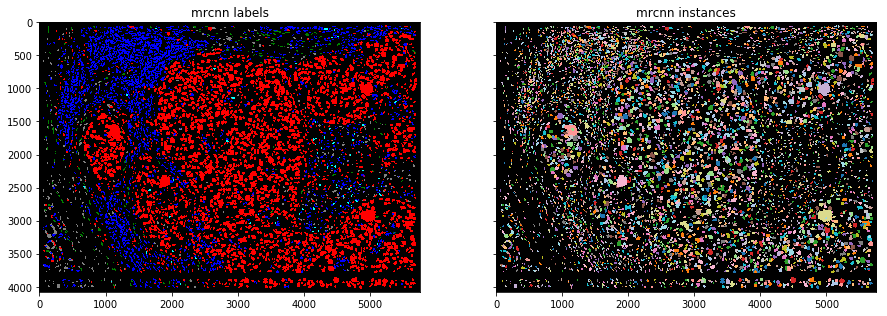

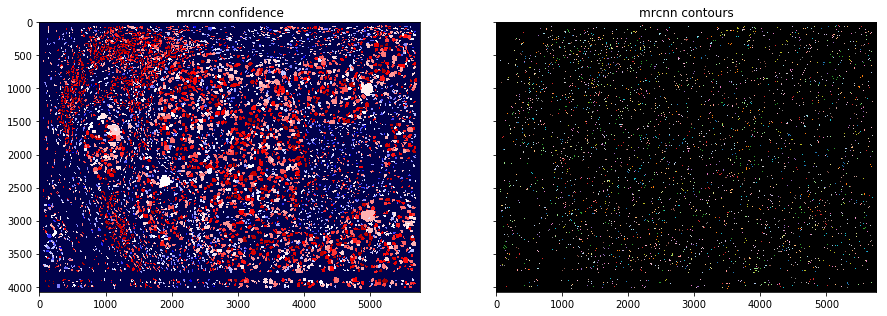

NameError: name 'region_disp' is not defined

In [22]:
# %%===========================================================================
# JUPYTER NOTEBOOK 
# =============================================================================

# re-map mrcnn labels to standardized codes (region)
label_channel = mrcnn[..., 0].copy()
for k in np.unique(label_channel):
    label_channel[label_channel == k] = code_rmap_dict[k]
mrcnn[..., 0] = label_channel.copy()
del label_channel

# Ignore areas outside ROI 
outside = np.argwhere(regions == codes_region["background"])
mrcnn[outside[:,0], outside[:,1], :] = codes_region["background"]

# occupy GT range for main classes -- mrcnn nuclei
labels_disp = mrcnn[..., 0].copy()
labels_disp[labels_disp > n_classes-1] = 0
labels_disp = occupy_full_GT_range(labels_disp, n_classes)

# maskrcnn
f, (ax1, ax2) = plt.subplots(1, 2, sharey=True, figsize=(15,15))
ax1.imshow(labels_disp, cmap= cmap_classlabels); ax1.set_title("mrcnn labels")
ax2.imshow(mrcnn[..., 1], cmap= cmap); ax2.set_title("mrcnn instances")
plt.show()

# maskrcnn
f, (ax1, ax2) = plt.subplots(1, 2, sharey=True, figsize=(15,15))
ax1.imshow(mrcnn[..., 2], cmap= 'seismic'); ax1.set_title("mrcnn confidence")
ax2.imshow(mrcnn[..., 3], cmap= cmap); ax2.set_title("mrcnn contours")
plt.show()

del (region_disp, bootstrap_disp, labels_disp)

In [19]:
# %%===========================================================================
# Reconcile mrcnn predictions with regions
# =============================================================================

print("\tReconciling mrcnn predictions with regions...")

mrcnn = reconcile_mrcnn_with_regions(
    mrcnn=mrcnn, regions=regions, 
    codes_region= codes_region, 
    code_rmap_dict= code_rmap_dict, 
    KEEP_CLASSES_CODES= KEEP_CLASSES_CODES)

	Reconciling mrcnn predictions with regions...


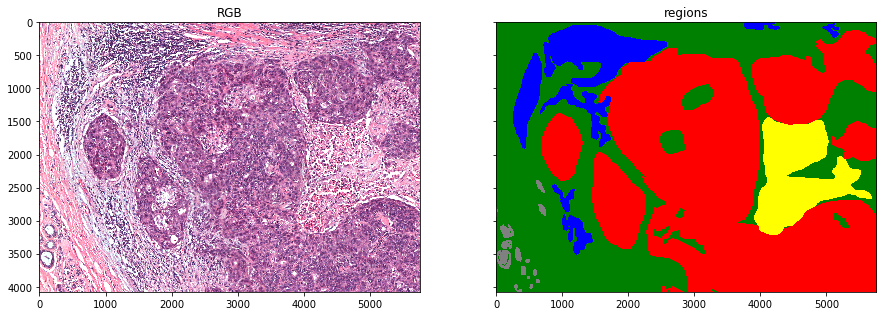

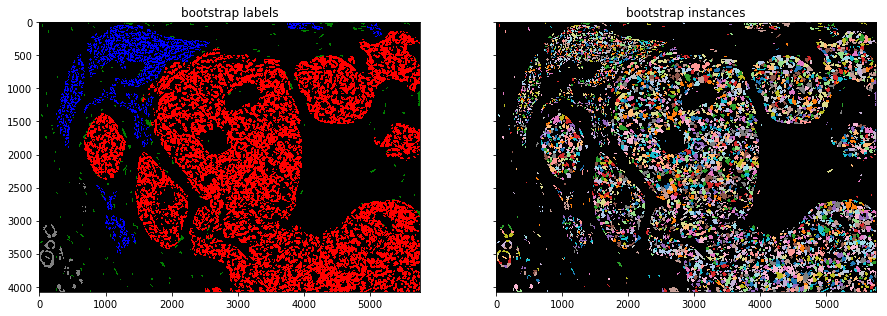

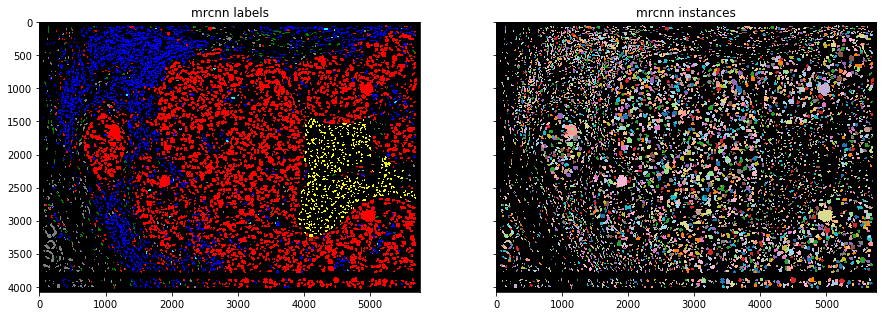

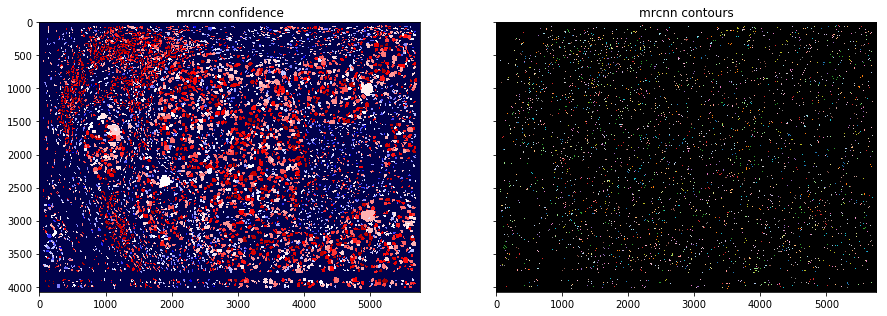

In [16]:
# %%===========================================================================
# JUPYTER NOTEBOOK 
# =============================================================================

# occupy GT range for main classes -- region
region_disp = regions.copy()
region_disp[region_disp > n_classes-1] = 0
region_disp = occupy_full_GT_range(region_disp, n_classes)

# occupy GT range for main classes -- bootstrap nuclei
bootstrap_disp = bootstrap[..., 0].copy()
bootstrap_disp[bootstrap_disp > n_classes-1] = 0
bootstrap_disp = occupy_full_GT_range(bootstrap_disp, n_classes)

# occupy GT range for main classes -- mrcnn nuclei
labels_disp = mrcnn[..., 0].copy()
labels_disp[labels_disp > n_classes-1] = 0
labels_disp = occupy_full_GT_range(labels_disp, n_classes)

# regions and bootstrap
f, (ax1, ax2) = plt.subplots(1, 2, sharey=True, figsize=(15,15))
ax1.imshow(im); ax1.set_title("RGB")
ax2.imshow(region_disp, cmap= cmap_classlabels); ax2.set_title("regions")
plt.show()

# regions and bootstrap
f, (ax1, ax2) = plt.subplots(1, 2, sharey=True, figsize=(15,15))
ax1.imshow(bootstrap_disp, cmap= cmap_classlabels); ax1.set_title("bootstrap labels")
ax2.imshow(bootstrap[..., 1], cmap= cmap); ax2.set_title("bootstrap instances")
plt.show()

# maskrcnn
f, (ax1, ax2) = plt.subplots(1, 2, sharey=True, figsize=(15,15))
ax1.imshow(labels_disp, cmap= cmap_classlabels); ax1.set_title("mrcnn labels")
ax2.imshow(mrcnn[..., 1], cmap= cmap); ax2.set_title("mrcnn instances")
plt.show()

# maskrcnn
f, (ax1, ax2) = plt.subplots(1, 2, sharey=True, figsize=(15,15))
ax1.imshow(mrcnn[..., 2], cmap= 'seismic'); ax1.set_title("mrcnn confidence")
ax2.imshow(mrcnn[..., 3], cmap= cmap); ax2.set_title("mrcnn contours")
plt.show()

del (region_disp, bootstrap_disp, labels_disp)

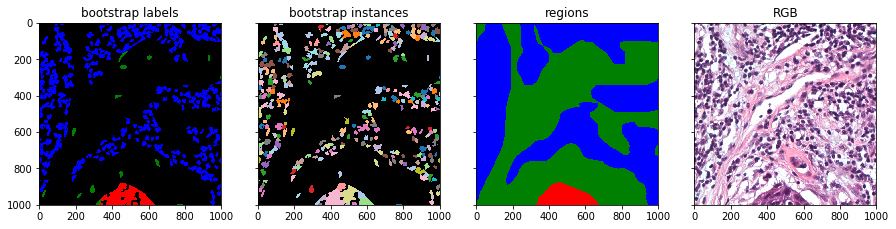

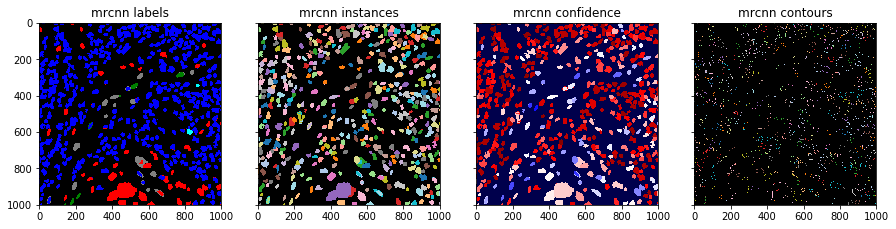

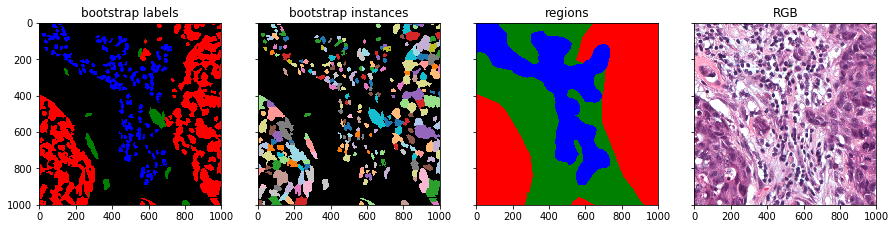

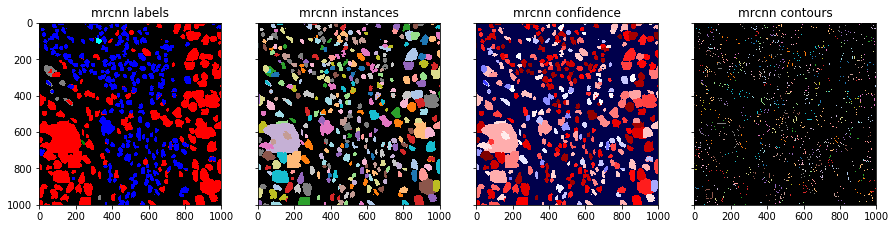

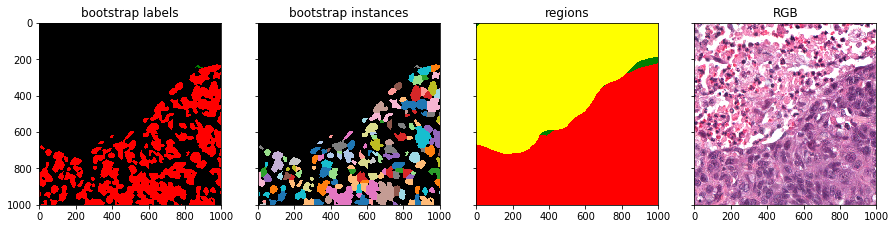

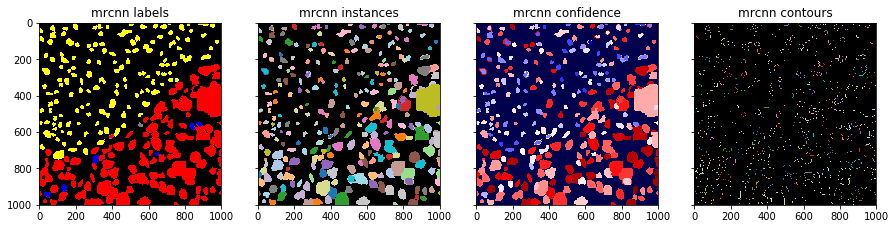

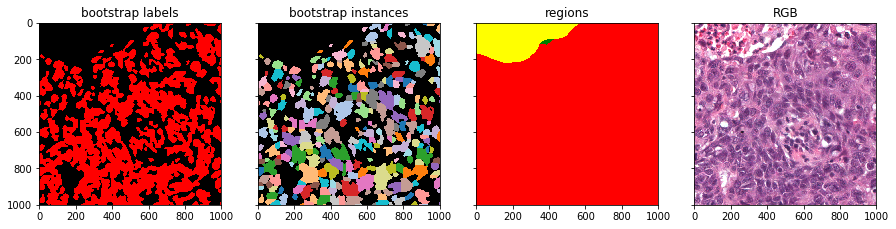

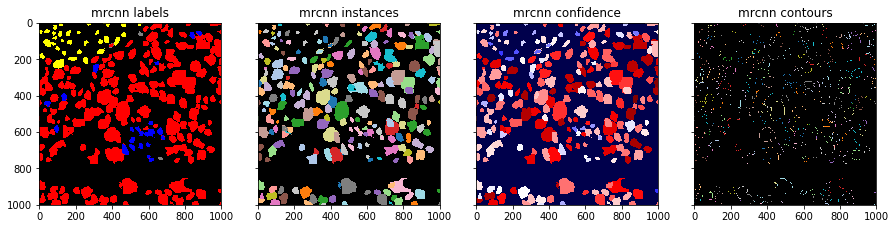

In [84]:
# %%===========================================================================
# JUPYTER NOTEBOOK 
# =============================================================================

snapshots = [(500, 500, 1500, 1500), 
             (1000, 1000, 2000, 2000),
             (2500, 4000, 3500, 5000),
             (3000, 4000, 4000, 5000),
            ]

for snapshot in snapshots:  
    (rowmin, colmin, rowmax, colmax) = snapshot
    
    # get equivalen tile in mrcnn, region +/- bootstrap file
    patch = mrcnn[rowmin:rowmax, colmin:colmax, :] 
    tile_region = regions[rowmin:rowmax, colmin:colmax] 
    tile_bootstrap = bootstrap[rowmin:rowmax, colmin:colmax, :]

    # occupy GT range for main classes -- region
    region_disp = tile_region.copy()
    region_disp[region_disp > n_classes-1] = 0
    region_disp = occupy_full_GT_range(region_disp, n_classes)

    # occupy GT range for main classes -- bootstrap nuclei
    bootstrap_disp = tile_bootstrap[..., 0].copy()
    bootstrap_disp[bootstrap_disp > n_classes-1] = 0
    bootstrap_disp = occupy_full_GT_range(bootstrap_disp, n_classes)

    # occupy GT range for main classes -- mrcnn nuclei
    labels_disp = patch[..., 0].copy()
    labels_disp[labels_disp > n_classes-1] = 0
    labels_disp = occupy_full_GT_range(labels_disp, n_classes)

    # regions and bootstrap
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharey=True, figsize=(15,15))
    ax1.imshow(bootstrap_disp, cmap= cmap_classlabels); ax1.set_title("bootstrap labels")
    ax2.imshow(tile_bootstrap[..., 1], cmap= cmap); ax2.set_title("bootstrap instances")
    ax3.imshow(region_disp, cmap= cmap_classlabels); ax3.set_title("regions")
    ax4.imshow(im[rowmin:rowmax, colmin:colmax, :]); ax4.set_title("RGB")
    plt.show()

    # maskrcnn
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharey=True, figsize=(15,15))
    ax1.imshow(labels_disp, cmap= cmap_classlabels); ax1.set_title("mrcnn labels")
    ax2.imshow(patch[..., 1], cmap= cmap); ax2.set_title("mrcnn instances")
    ax3.imshow(patch[..., 2], cmap= 'seismic'); ax3.set_title("mrcnn confidence")
    ax4.imshow(patch[..., 3], cmap= cmap); ax4.set_title("mrcnn contours")
    plt.show()

    print("=============================================================")

In [85]:
# %%===========================================================================
# Get nuclei stats
# =============================================================================

# get nucleus ids of nuclei discordant with regions
print("\tGetting discordant nuclei")
discordant_nuclei = get_discordant_nuclei(mrcnn=mrcnn, regions=regions)

	Getting discordant nuclei


In [86]:
# get nucleus annotation dataframe as well as outlier nuclei
print("\tGetting nuclei dataframe as well as outlier nuclei")
Annots_DF, extreme_nuclei, segmentation_artifacts = get_nuclei_props_and_outliers(
    imname= imname, mrcnn= mrcnn, props_fraction= props_fraction, 
    ignore_codes= ignore_codes)

	Getting nuclei dataframe as well as outlier nuclei
	Getting props for 1
		prop 0 of 2929
		prop 500 of 2929
		prop 1000 of 2929
		prop 1500 of 2929
		prop 2000 of 2929
		prop 2500 of 2929
	Getting props for 2
		prop 0 of 212
	Getting props for 3
		prop 0 of 2432
		prop 500 of 2432
		prop 1000 of 2432
		prop 1500 of 2432
		prop 2000 of 2432
	Getting props for 4
		prop 0 of 565
		prop 500 of 565
	Getting props for 5
		prop 0 of 4
	Getting props for 10
		prop 0 of 42
	Getting props for 13
		prop 0 of 64
	Getting props for 18
		prop 0 of 20
	Getting props for 21
		prop 0 of 341


In [87]:
# %%===========================================================================
# JUPYTER NOTEBOOK 
# =============================================================================

Annots_DF[:2]

,unique_nucleus_id,slide_name,nucleus_label,area,extent,aspect,circularity,nucleus_label_confidence,roi_offset_xmin_ymin,center_relative_to_slide_x_y,bounding_box_relative_to_slide_xmin_ymin_xmax_ymax,boundary_relative_to_slide_x_coords,boundary_relative_to_slide_y_coords
29,TCGA-A1-A0SP-DX1_8202_53798_HS0CR,TCGA-A1-A0SP-DX1,1,2070,44,49,15,54,"6798,53719","8202,53798","8162,53778,8249,53831","8167,8168,8169,8170,8171,8172,8173,8174,8175,8...","53778,53778,53778,53778,53778,53778,53778,5377..."
32,TCGA-A1-A0SP-DX1_8259_53837_7J4PA,TCGA-A1-A0SP-DX1,1,53,7,54,62,44,"6798,53719","8259,53837","8255,53826,8283,53853","8266,8255,8256,8257,8255,8256,8257,8258,8255,8...","53826,53831,53831,53831,53832,53832,53832,5383..."


In [88]:
# Add flags for nuclei worth reviewing

print("\tGetting outlier nuclei masks")

Annots_DF.loc[:, "discordant_with_region_flag"] = 0
Annots_DF.loc[:, "weird_shape_or_small_area_flag"] = 0
Annots_DF.loc[:, "maybe_artifact_flag"] = 0

Annots_DF.loc[discordant_nuclei, "discordant_with_region_flag"] = 1
discordant = np.isin(mrcnn[..., 1], discordant_nuclei)

Annots_DF.loc[extreme_nuclei, "weird_shape_or_small_area_flag"] = 1
extreme = np.isin(mrcnn[..., 1], extreme_nuclei)

Annots_DF.loc[segmentation_artifacts, "maybe_artifact_flag"] = 1
artifacts = np.isin(mrcnn[..., 1], segmentation_artifacts)

low_confidence = mrcnn[..., 2] < confidence_thresh
low_confidence[mrcnn[..., 0] == 0] = 0

	Getting outlier nuclei masks


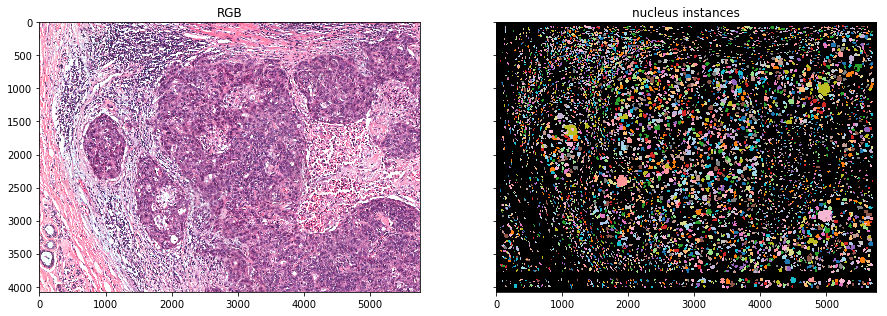

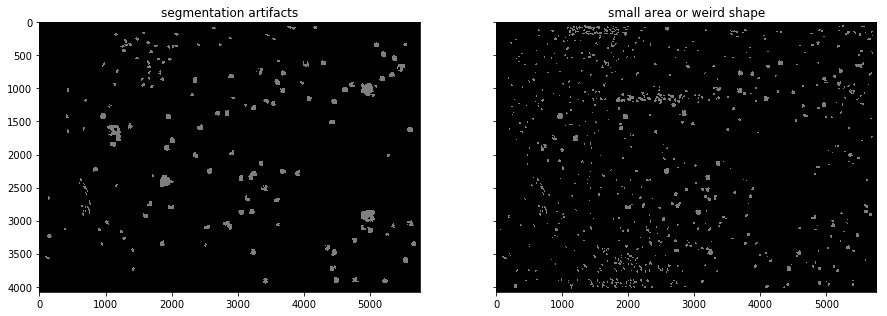

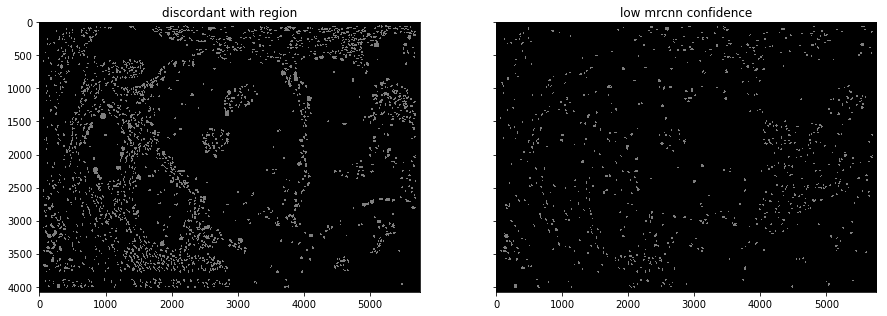

In [89]:
# %%===========================================================================
# JUPYTER NOTEBOOK 
# =============================================================================

f, (ax1, ax2) = plt.subplots(1, 2, sharey=True, figsize=(15,15))
ax1.imshow(im); ax1.set_title("RGB")
ax2.imshow(mrcnn[..., 1], cmap=cmap); ax2.set_title("nucleus instances")
plt.show()

f, (ax1, ax2) = plt.subplots(1, 2, sharey=True, figsize=(15,15))
ax1.imshow(artifacts, cmap=cmap); ax1.set_title("segmentation artifacts")
ax2.imshow(extreme, cmap=cmap); ax2.set_title("small area or weird shape")
plt.show()

f, (ax1, ax2) = plt.subplots(1, 2, sharey=True, figsize=(15,15))
ax1.imshow(discordant, cmap=cmap); ax1.set_title("discordant with region")
ax2.imshow(low_confidence, cmap=cmap); ax2.set_title("low mrcnn confidence")
plt.show()

In [111]:
# %%===========================================================================
# Divide into FOV proposals and choose fovs for review
# =============================================================================

print("\tGetting fov stats")
FOV_stats = get_fov_stats(
    mrcnn=mrcnn, low_confidence=low_confidence, discordant=discordant, 
    extreme=extreme, artifacts= artifacts, 
    roi_mask = regions != 0, keep_thresh= 0.5,
    fov_dims= fov_dims, shift_step= shift_step)

	Getting fov stats
	Getting FOV proposal stats ...
		FOV 0 of 368


In [112]:
# %%===========================================================================
# JUPYTER NOTEBOOK 
# =============================================================================

FOV_stats[:2]

,fovidx,xmin,xmax,ymin,ymax,n_total,predominant_label,ratio_predominant,ratio_non_predominant,n_low_confidence,n_discordant,n_extreme,n_artifacts
0,0,0,256,0,256,4,2,50,50,1,2,0,0
1,1,256,512,0,256,19,1,42,58,7,18,3,0


In [113]:
print("\tChoosing fov's for review")
review_fovs = choose_fovs_for_review_stratified(
    FOV_stats= FOV_stats, 
    im_shape = mrcnn.shape[:2],
    min_nuclei_per_fov= min_nuclei_per_fov, 
    fovs_per_prop= fovs_per_prop_review, 
    exclude_edge= exclude_edge,
    relevant_labels= relevant_labels_for_fov_choice,
)

# process to be relative to slide coords
slide_name = imname.split("_")[0]
roi_xmin = int(imname.split("_xmin")[1].split("_")[0])
roi_ymin = int(imname.split("_ymin")[1].split("_")[0])
review_fovs["slide_name"] = slide_name
review_fovs["xmin"] = review_fovs["xmin"] + roi_xmin
review_fovs["xmax"] = review_fovs["xmax"] + roi_xmin
review_fovs["ymin"] = review_fovs["ymin"] + roi_ymin
review_fovs["ymax"] = review_fovs["ymax"] + roi_ymin

	Choosing fov's for review
	Choosing FOV's for 1.0
	Choosing FOV's for 3.0


In [114]:
# %%===========================================================================
# JUPYTER NOTEBOOK 
# =============================================================================

review_fovs

,fovidx,xmin,xmax,ymin,ymax,propname,predominant_label,ratio_predominant,ratio_non_predominant,n_low_confidence,n_discordant,n_extreme,n_artifacts,slide_name
0,105,10126,10382,54743,54999,ratio_predominant,1,100,0,2,0,5,2,TCGA-A1-A0SP-DX1
1,108,10894,11150,54743,54999,ratio_predominant,1,100,0,0,2,2,1,TCGA-A1-A0SP-DX1
2,193,9102,9358,55767,56023,ratio_predominant,1,100,0,0,0,2,2,TCGA-A1-A0SP-DX1
3,195,9614,9870,55767,56023,ratio_predominant,1,100,0,0,0,2,0,TCGA-A1-A0SP-DX1
4,333,9614,9870,57303,57559,ratio_predominant,1,100,0,0,2,1,0,TCGA-A1-A0SP-DX1
5,342,11918,12174,57303,57559,ratio_predominant,1,100,0,0,0,2,0,TCGA-A1-A0SP-DX1
6,60,10382,10638,54231,54487,ratio_non_predominant,1,42,58,8,17,6,2,TCGA-A1-A0SP-DX1
7,163,7310,7566,55511,55767,ratio_non_predominant,1,43,57,7,14,6,0,TCGA-A1-A0SP-DX1
8,186,7310,7566,55767,56023,ratio_non_predominant,1,45,55,3,9,1,0,TCGA-A1-A0SP-DX1
9,203,11662,11918,55767,56023,ratio_non_predominant,1,36,64,2,9,2,0,TCGA-A1-A0SP-DX1


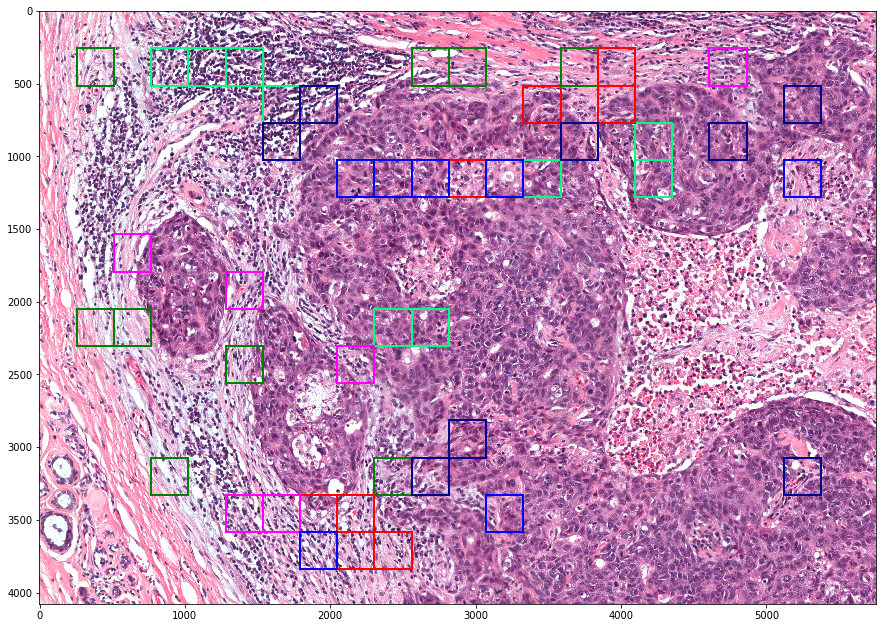

In [110]:
# %%===========================================================================
# JUPYTER NOTEBOOK 
# =============================================================================

fov_colors = {
    "ratio_predominant": "springgreen",
    "ratio_non_predominant": "green",
    "n_low_confidence": "red",
    "n_discordant": "magenta",
    "n_extreme": "blue",
    "n_artifacts": "darkblue",
}

# Create figure and axes
fig, ax = plt.subplots(1, figsize=(15,15))

# Display the image
ax.imshow(im)

for fovidx in range(review_fovs.shape[0]):
   
    rmin = review_fovs.loc[fovidx, "ymin"] - roi_ymin
    rmax = review_fovs.loc[fovidx, "ymax"] - roi_ymin
    cmin = review_fovs.loc[fovidx, "xmin"] - roi_xmin
    cmax = review_fovs.loc[fovidx, "xmax"] - roi_xmin
    propname = review_fovs.loc[fovidx, "propname"]

    # Create a Rectangle patch -- review FOVs
    rect = patches.Rectangle(
        xy= (cmin,rmin), width= cmax-cmin, 
        height= rmax-rmin, linewidth=2,
        edgecolor= fov_colors[propname],
        facecolor='none', linestyle='-')

    # Add the patch to the Axes
    ax.add_patch(rect)

plt.show()

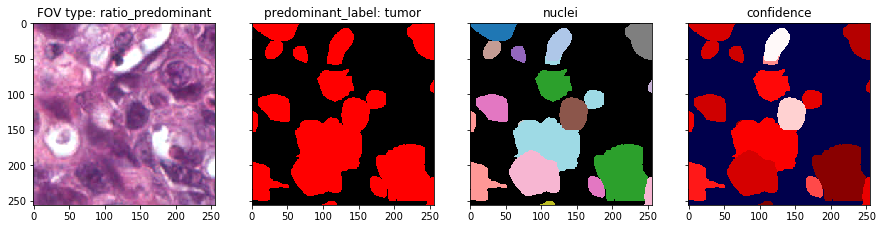

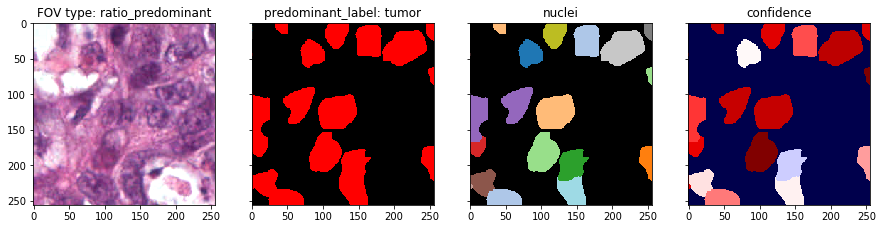

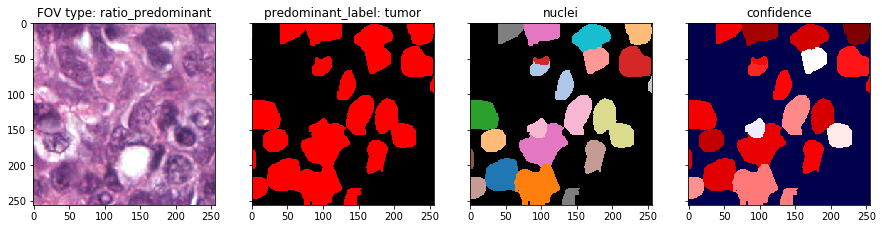

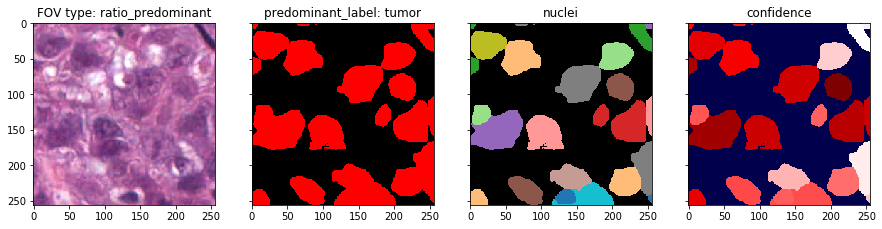

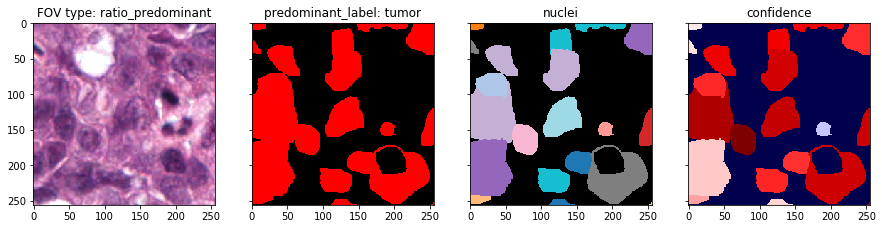

...

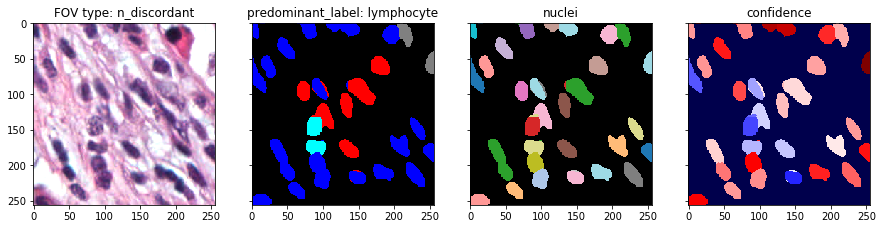

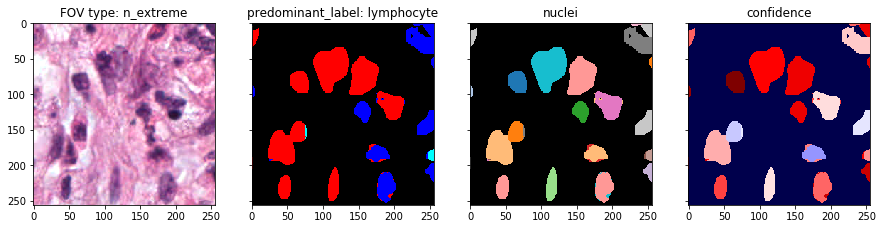

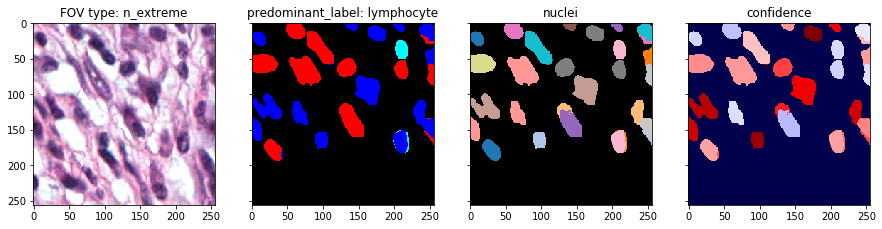

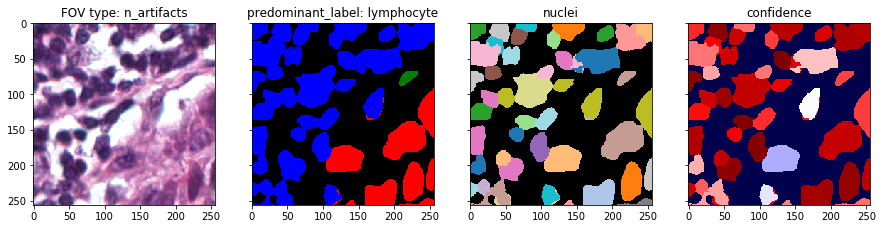

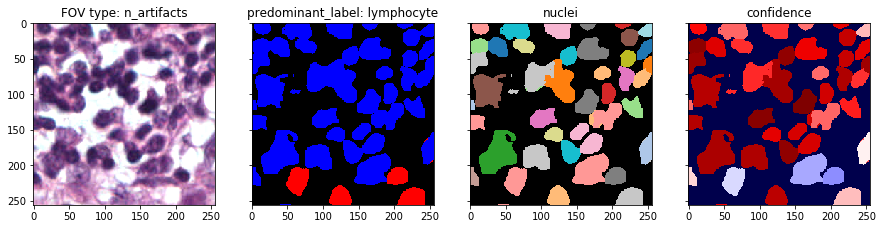

In [95]:
# %%===========================================================================
# JUPYTER NOTEBOOK 
# =============================================================================

for fovidx in range(review_fovs.shape[0]):
    
    rmin = review_fovs.loc[fovidx, "ymin"] - roi_ymin
    rmax = review_fovs.loc[fovidx, "ymax"] - roi_ymin
    cmin = review_fovs.loc[fovidx, "xmin"] - roi_xmin
    cmax = review_fovs.loc[fovidx, "xmax"] - roi_xmin
    
    propname = review_fovs.loc[fovidx, "propname"]
    predominant_label = review_fovs.loc[fovidx, "predominant_label"]

    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharey=True, figsize=(15,15))
    
    # occupy GT range for main classes -- mrcnn nuclei
    labels_disp = mrcnn[rmin:rmax,cmin:cmax,0].copy()
    labels_disp[labels_disp > n_classes-1] = 0
    labels_disp = occupy_full_GT_range(labels_disp, n_classes)

    ax1.imshow(im[rmin:rmax,cmin:cmax]); ax1.set_title(
        "FOV type: %s" % (propname)); 
    ax2.imshow(labels_disp, cmap=cmap_classlabels); ax2.set_title(
        "predominant_label: %s" % (codes_region_reverse[predominant_label],)); 
    ax3.imshow(mrcnn[rmin:rmax,cmin:cmax,1], cmap=cmap); ax3.set_title("nuclei")
    ax4.imshow(mrcnn[rmin:rmax,cmin:cmax,2], cmap='seismic'); ax4.set_title("confidence")
    plt.show()

In [96]:
# save mrcnn reconciled-with-region mask as hickle binary
mrcnn = mrcnn.astype(np.float32)    
savename = "%s%s.hkl" % (mask_save_path, imname)
print("saving", savename)
with open(savename, 'w') as f:
    hkl.dump(mrcnn, f) 

saving /home/mohamedt/Desktop/WSI_Segmentation/Results/TCGA_maskrcnn/19July2018/nucleus20180720T1413_0030/mrcnn_regions_incorp/TCGA-A1-A0SP-DX1_xmin6798_ymin53719_.hkl


In [ ]:
# add annotations and fovs to database
add_annots_and_fovs_to_db(
    Annots_DF= Annots_DF, review_fovs= review_fovs, 
    sqlite_save_path= sqlite_save_path, 
    create_tables= imidx == 0)

In [ ]:
#%% ========================================================================================
#%% ========================================================================================
#%% ========================================================================================